# DL Assignment 2
## Group 4
**AUTHORS**:
*   Dario Mameli [dario.mameli@ugent.be]
*   Àngel Masip LLopis [angel.masipllopis@ugent.be]
*   Michele Russo [michele.russo@ugent.be]



This notebook is to be intended as both report and code.

Running on google colab is suggested to make sure all required libraries and packages are present.

# Setup

Firstly let's install and upgrade the necessary packages

In [35]:
!git clone https://github.com/DarioMameli/DL_Ass2
import sys
# Add the repository to the path
sys.path.insert(1, '/content/DL_Ass2/')

Cloning into 'DL_Ass2'...
remote: Enumerating objects: 1476, done.
remote: Counting objects: 100% (25/25), done.
remote: Compressing objects: 100% (21/21), done.
remote: Total 1476 (delta 6), reused 23 (delta 4), pack-reused 1451
Receiving objects: 100% (1476/1476), 461.99 MiB | 24.64 MiB/s, done.
Resolving deltas: 100% (6/6), done.
Updating files: 100% (1453/1453), done.


In [1]:

!pip uninstall keras

# Install the latest version of TensorFlow, which includes Keras (tf.keras)
!pip install tensorflow
!pip install keras --upgrade --quiet
!pip install keras-tuner --upgrade
!pip install PrettyTable
!pip install saliency
!pip install lime
!pip install tf-keras-vis

Found existing installation: keras 2.15.0
Uninstalling keras-2.15.0:
  Would remove:
    /usr/local/lib/python3.10/dist-packages/keras-2.15.0.dist-info/*
    /usr/local/lib/python3.10/dist-packages/keras/*
Proceed (Y/n)? Y
  Successfully uninstalled keras-2.15.0
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 6.7 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.15.0 requires keras<2.16,>=2.15.0, but you have keras 3.0.5 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.2/86.2 kB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 2.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime:

Let's import all the necessary functions and packages

In [2]:
import matplotlib.pyplot as plt
import numpy as np

import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import keras
from keras import regularizers
import matplotlib.gridspec as gridspec
from keras.datasets import fashion_mnist
from keras.layers import Dense, Flatten, Dropout
from keras.models import Sequential
from keras.utils import to_categorical
import keras_tuner as kt
from tensorflow.keras.layers import Conv2DTranspose
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import roc_curve, confusion_matrix, ConfusionMatrixDisplay
from dl_utils import plot_history
from sklearn.metrics import confusion_matrix, classification_report, f1_score, precision_score, recall_score
import gdown
import zipfile
import os
from PIL import Image
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from prettytable import PrettyTable
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model

In [36]:
import matplotlib.pyplot as plt
import numpy as np

import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import keras
from keras import regularizers
import matplotlib.gridspec as gridspec
from keras.datasets import fashion_mnist
from keras.models import Sequential
from keras.utils import to_categorical
import keras_tuner as kt
from keras import backend as backend
from keras.layers import (
    Input,
    Activation,
    BatchNormalization,
    Conv2D,
    Conv2DTranspose,
    Dense,
    Dropout,
    Flatten,
    GlobalAveragePooling2D,
    MaxPooling2D,
)
from keras.optimizers import SGD, Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, confusion_matrix, ConfusionMatrixDisplay
from dl_utils import plot_history
from sklearn.metrics import confusion_matrix, classification_report, f1_score, precision_score, recall_score
import gdown
import zipfile
import os
from PIL import Image
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

import tensorflow as tf
import keras.applications as app
from keras.layers import Dense, GlobalAveragePooling2D
from keras.models import Model

from google.colab import files
import gc
import json

Check the versions of the packages

In [3]:
print(tf.__version__)
print(keras.__version__)

2.15.0
3.0.5


Check the runtime device

In [4]:
tf.config.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

# Load data

Load the training and test set and display its shape

In [ ]:

#https://drive.google.com/file/d/18j4OvAlNWX9pfaoiJNgcTEVslksaf4Dw/view?usp=sharing
#https://drive.google.com/file/d/12aEK83cwTZyxtz2blCGxTpseZO5_dw6Z/view?usp=sharing
# Google Drive file ID of your zip file
#file_id = '12aEK83cwTZyxtz2blCGxTpseZO5_dw6Z'
# URL for downloading the file from Google Drive
#url = f'https://drive.google.com/uc?id={file_id}'
# Destination path for the downloaded zip file (in Google Colab)
#zip_file_path = '/content/file.zip'
# Download the file
#gdown.download(url, zip_file_path, quiet=False)

If the cell above is not working then execute the next one

In [5]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)


ValueError: The domain policy has disabled Drive File Stream: https://support.google.com/a/answer/7496409

In [ ]:
!cp '/content/drive/MyDrive/images.zip' zipfile

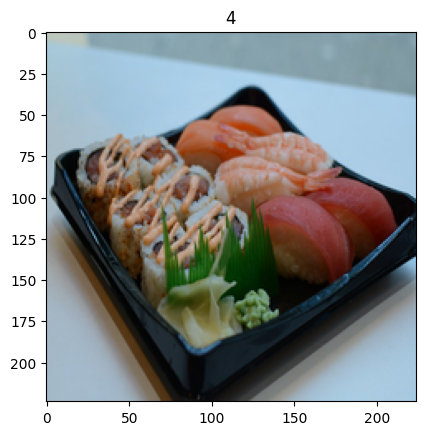

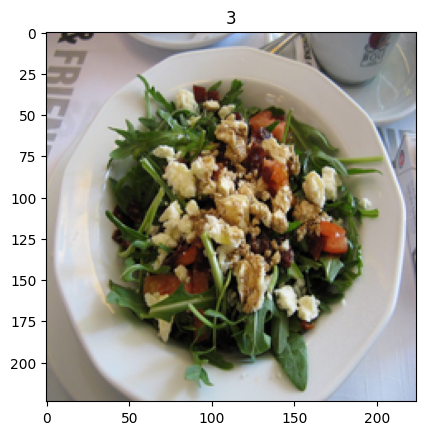

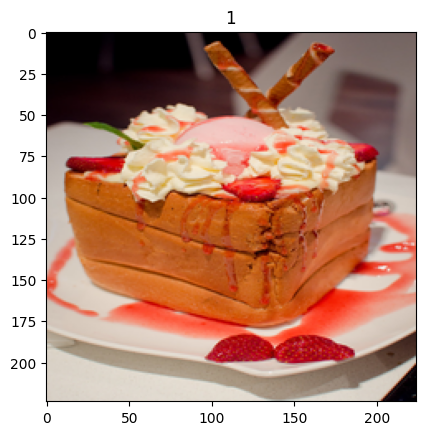

In [6]:
zip_file_path = 'images.zip'
# Extract the contents of the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall('/content/extracted_folder')

# Define the paths for X and y
X = []
y = []

# Iterate through the extracted folder
for root, dirs, files in os.walk('/content/extracted_folder/images'):
    for folder_name in dirs:
        folder_path = os.path.join(root, folder_name)

        # Sort the list of files to ensure a consistent order
        #file_list = sorted(os.listdir(folder_path))

        # Iterate through sorted images in each folder
        for image_file in os.listdir(folder_path):
            image_path = os.path.join(folder_path, image_file)

            # Load the image and convert it to a numpy array if needed
            img = Image.open(image_path)
            img_array = np.array(img)
            X.append(img)
            y.append(folder_name)

# Convert y to numerical labels using LabelEncoder from sklearn
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Resizing all the images
resized_images = []
# Define the target size
width = 224
height = 224
target_size = (width, height)

# Resize each image to the target size using LANCZOS resampling
for img in X:
    resized_img = img.resize(target_size, Image.LANCZOS)
    resized_images.append(resized_img)
# Convert the list of resized images to a NumPy array
X_array = np.array([np.array(img) for img in resized_images])
plt.imshow(X_array[1000])
plt.title(y[1000])
plt.show()
plt.imshow(X_array[500])
plt.title(y[500])
plt.show()
plt.imshow(X_array[0])
plt.title(y[0])
plt.show()

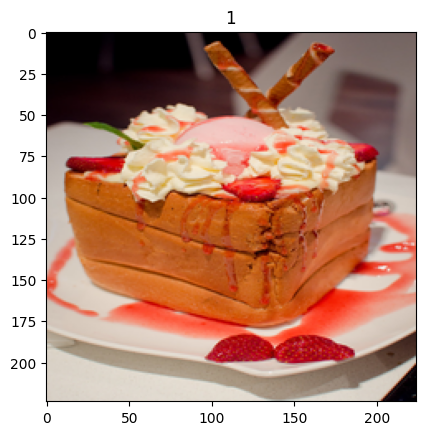

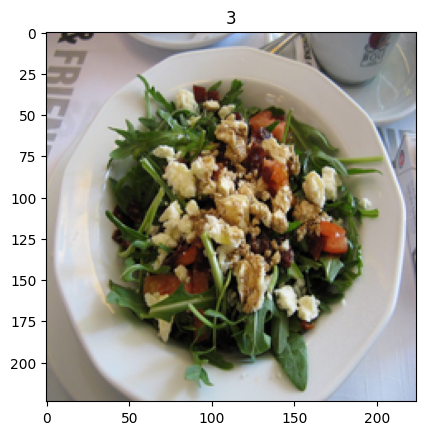

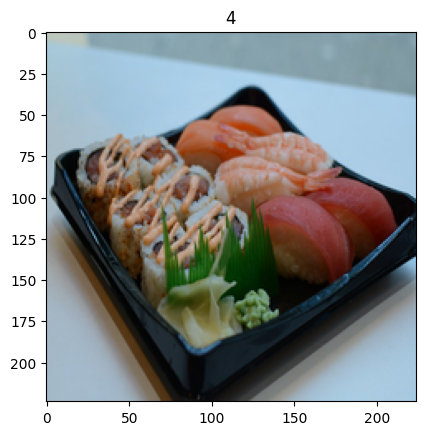

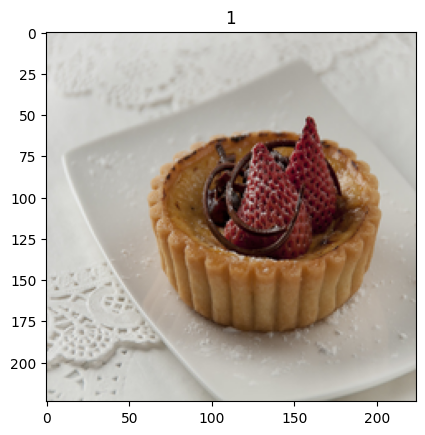

(1443,)


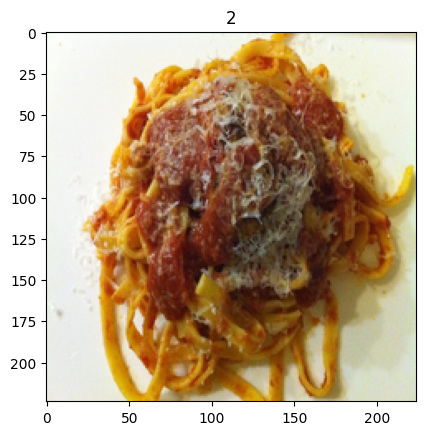

1 1 3 0 4 2


In [7]:
plt.imshow(X_array[0])
plt.title(y[0])
plt.show()
plt.imshow(X_array[500])
plt.title(y[500])
plt.show()
plt.imshow(X_array[1000])
plt.title(y[1000])
plt.show()
plt.imshow(X_array[200])
plt.title(y[200])
plt.show()
print(y.shape)
plt.imshow(X_array[1400])
plt.title(y[1400])
plt.show()
print(y[0], y[200], y[500], y[800],y[1000],y[1300])

In [8]:
SEED=33
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_array, y, test_size=0.1, shuffle=True, random_state=SEED)

Preprocess the feature vectors (normalize data)

In [9]:
# Input data preprocessing
print(np.min(X_train), np.max(y_train))
X_train = X_train.astype("float32")
X_test = X_test.astype("float32")

#normalization
X_train /= 255
X_test /= 255

print(X_train.shape[0], "train samples")
print(X_test.shape[0], "test samples")


0 4
1298 train samples
145 test samples


Preprocess the labels (one-hot encodings)

In [10]:
# Labels preprocessing
min = np.min(y_train)
max = np.max(y_train)
print(min, max)
num_classes = max + 1

y_train = to_categorical(y_train, num_classes)
y_test = to_categorical(y_test, num_classes)

print("First label is now = ", y_train[0])

0 4
First label is now =  [0. 0. 0. 1. 0.]


## Validation data
Split training data into training and validation data, so that a full training-validation-test split is obtained, for maximizing the generalization performance.

In [11]:
# Split training data into training and validation
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, shuffle=True,  random_state=SEED) # for reproducibility

##Build a Baseline model

In [ ]:
def CNNModel(num_classes):
    model = Sequential()
    model.add(Conv2D(16, (3, 3), activation='relu', input_shape=(224, 224, 3)))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(32, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dense(num_classes, activation='softmax'))
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    return model

In [ ]:
num_classes = 5
model = CNNModel(num_classes)
model.summary()

NameError: name 'CNNModel' is not defined

##Our Model

In [ ]:
class MyCNNModel(kt.HyperModel):
    def __init__(self, loss="categorical_crossentropy"):
        self.loss = loss

    def build(self, hp):
        model = self.build_CNN(hp)
        return model

    def build_CNN(self, hp):
        hp_units1 = hp.Int('unitsL1', min_value=16, max_value=256, step=16)
        hp_units2 = hp.Int('unitsL2', min_value=16, max_value=256, step=16)
        hp_activation = hp.Choice("activation", [ "relu"])
        hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])
        hp_dropout_rate = hp.Float('dropout_rate', min_value=0.0, max_value=0.5, step=0.1)
        hp_optimizer = hp.Choice('optimizer', values=['adam'])

        model = self.build_CNN_hp(
            hp_units1=hp_units1, hp_units2=hp_units2, hp_activation=hp_activation,
            hp_learning_rate=hp_learning_rate, hp_optimizer=hp_optimizer, hp_dropout_rate=hp_dropout_rate
        )
        return model

    def build_CNN_hp(self, hp_units1, hp_units2, hp_activation, hp_learning_rate,
                     hp_optimizer, hp_dropout_rate):
        model = Sequential()
        model.add(Conv2D(hp_units1, (3, 3), activation=hp_activation, input_shape=(224, 224, 3)))
        model.add(MaxPooling2D((2, 2)))
        model.add(Conv2D(hp_units2, (3, 3), activation=hp_activation))
        model.add(MaxPooling2D((2, 2)))
        model.add(Flatten())
        model.add(Dense(hp_units1, activation=hp_activation))
        model.add(Dropout(hp_dropout_rate))
        model.add(Dense(hp_units2, activation=hp_activation))
        model.add(Dropout(hp_dropout_rate))
        model.add(Dense(5, activation="softmax"))

        optimizer = Adam(learning_rate=hp_learning_rate)
        loss = "categorical_crossentropy"

        model.compile(optimizer=optimizer, loss=loss, metrics=["accuracy"])
        return model

    def fit(self, hp, model, *args, **kwargs):
        datagen_train = ImageDataGenerator(
           rotation_range=10,
           width_shift_range=0.1,
            height_shift_range=0.1,
           shear_range=0.2,
           zoom_range=0.2,
            horizontal_flip=True,
            vertical_flip=True,
            fill_mode='nearest'
        )


        datagen_train.fit(X_train)

        datagen_val = ImageDataGenerator(
          rotation_range=10,
          width_shift_range=0.1,
          height_shift_range=0.1,
          shear_range=0.2,
          zoom_range=0.2,
          horizontal_flip=True,
          vertical_flip=True,
          fill_mode='nearest'
        )


        datagen_val.fit(X_val)

        return model.fit(
            datagen_train.flow(X_train, y_train, batch_size=128, shuffle=True),
            validation_data=datagen_val.flow(X_val, y_val, batch_size=128, shuffle=True)
        )


In [ ]:
# Define the hyperband tuner object, passing the model where to perform the search
tuner = kt.Hyperband(MyCNNModel(),
                     objective='val_accuracy',
                     max_epochs=20,

                     max_consecutive_failed_trials=5,
                     project_name='my_cnn_tuning',
                     directory='my_cnn_tuning',
)

# Summarize the search space
tuner.search_space_summary()


Reloading Tuner from my_cnn_tuning/my_cnn_tuning/tuner0.json
Search space summary
Default search space size: 6
unitsL1 (Int)
{'default': None, 'conditions': [], 'min_value': 16, 'max_value': 256, 'step': 16, 'sampling': 'linear'}
unitsL2 (Int)
{'default': None, 'conditions': [], 'min_value': 16, 'max_value': 256, 'step': 16, 'sampling': 'linear'}
activation (Choice)
{'default': 'gelu', 'conditions': [], 'values': ['gelu', 'relu'], 'ordered': False}
learning_rate (Choice)
{'default': 0.01, 'conditions': [], 'values': [0.01, 0.001, 0.0001], 'ordered': True}
dropout_rate (Float)
{'default': 0.0, 'conditions': [], 'min_value': 0.0, 'max_value': 0.5, 'step': 0.1, 'sampling': 'linear'}
optimizer (Choice)
{'default': 'adam', 'conditions': [], 'values': ['adam'], 'ordered': False}


# Training


## Baseline's training

Here we train the baseline model using the same parameters specified in the lab.

In [12]:
batch_size = 128
epochs = 5


In [ ]:
# Fit the model
history = model.fit(X_train, y_train, batch_size=batch_size, epochs=epochs, verbose=1, validation_data=(X_val, y_val))
plot_history(history)

Epoch 1/5
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 915ms/step - accuracy: 0.2201 - loss: 6.5232

KeyboardInterrupt: 

Save the baseline model in the workspace

In [ ]:
model.save('/content/baseline_model.keras')

In [ ]:
print("Original shape of X_train:", X_train.shape)


## Training the best model


In [ ]:
# Early stop to prevent overfitting
stop_early = tf.keras.callbacks.EarlyStopping(
  monitor="val_loss",
  min_delta=0,
  patience=10,
  verbose=0,
  mode="auto",
  baseline=None,
  restore_best_weights=True,
  start_from_epoch=5,
)

# Perform the search
tuner.search(X_train, y_train, validation_data=(X_val, y_val), callbacks=[stop_early])

# Get the optimal hyperparameters
best_hps=tuner.get_best_hyperparameters(num_trials=1)[0]

# Build the model with the optimal hyperparameters and train it on the data for maximum 50 epochs
best_model = tuner.hypermodel.build(best_hps)

#train the model with the whole data set
#we should eliminate the validation state since it is not useful anymore
history = best_model.fit(X_train, y_train, epochs=15, validation_data=(X_val, y_val), callbacks=[stop_early])

# Plot the training summary
plot_history(history)

val_acc_per_epoch = history.history['val_accuracy']
best_epoch = np.argmax(val_acc_per_epoch) + 1
print('Best epoch: %d' % (best_epoch,))

Save the best model in the workspace

In [ ]:
best_model.save('/content/best_model.keras')

#Evaluation


## Baseline evaluation

Print the loss and accuracy of the trained baseline model.

In [ ]:
base_score = model.evaluate(X_test, y_test, verbose=0)

print("Baseline model")
print("Test loss:", base_score[0])
print("Test accuracy:", base_score[1])

## Best model evaluation
Print the best hyperparameters found by the hyperband tuner.

Print the loss and accuracy of the best model.

Print the accuracy increment in the test set.

The test set is not subject to augmentation as it should not be manipulated, but only be used as references for evaluation.

In [ ]:
best_score = best_model.evaluate(X_test, y_test, verbose=0)

# Evaluate and print results
best_score = best_model.evaluate(X_test, y_test, verbose=0)
print("Best model")
print("Best parameters:", best_hps.values)
print("Test loss:", best_score[0])
print("Test accuracy:", best_score[1])
print("Test accuracy improvement:", 100*(best_score[1]-base_score[1])/base_score[1], "%")

##Pretrained network

In [13]:

input_shape = (X_train.shape[1],X_train.shape[2],X_train.shape[3])
#modify the dimensions of the images to adapt to the input of the neural network

#pretrained network ResNet50
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape, classes=num_classes)


x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.25)(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.25)(x)
# Add a Dense layer with number of units matching your number of classes
predictions= Dense(units=5, activation='softmax')(x)


# Create the final model
dnn_model = Model(inputs=base_model.input, outputs=predictions)

# Set layers before the final classifier to be non-trainable
for layer in dnn_model.layers[:-10]:
    layer.trainable = False

# Set the final classifier layers to be trainable
for layer in dnn_model.layers[-10:]:
    layer.trainable = True

print(len(dnn_model.layers))
dnn_model.summary()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
181


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_pad (ZeroPadding2D) │ (None, 230, 230, 3)    │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,472 │ conv1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pad (ZeroPadding2D) │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1_pool (MaxPooling2D) │ (None, 56, 56, 64)     │              0 │ pool1_pad[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 64)     │          4,160 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 64)     │         36,928 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_bn         │ (None, 56, 56, 64)     │            256 │ conv2_block1_2_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_2_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_conv       │ (None, 56, 56, 256)    │         16,640 │ pool1_pool[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_3_conv       │ (None, 56, 56, 256)    │         16,640 │ conv2_block1_2_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 24,703,109 (94.23 MB)

 Trainable params: 2,170,117 (8.28 MB)

 Non-trainable params: 22,532,992 (85.96 MB)

In [14]:
# Early stop to prevent overfitting
stop_early = tf.keras.callbacks.EarlyStopping(
  monitor="val_loss",
  min_delta=0,
  patience=10,
  verbose=0,
  mode="auto",
  baseline=None,
  restore_best_weights=True,
  start_from_epoch=5,

)



train_datagen = ImageDataGenerator(#rescale=1./255,
    rotation_range=20,
    #width_shift_range=0.2,
    #height_shift_range=0.2,
    #shear_range=0.2,
    zoom_range=0.2,
    vertical_flip=True,
    #fill_mode='nearest'
    )

val_datagen = ImageDataGenerator(rescale=1./255)


train_generator = train_datagen.flow(X_train, y_train, batch_size=128, shuffle=True)

#validation_generator = val_datagen.flow(X_val, y_val, batch_size=128, shuffle=True)

#set the possible learning rates
lr=[1e-3, 1e-4,0.0001,0.00001]


dnn_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00005), loss='categorical_crossentropy', metrics=['accuracy'])
history = dnn_model.fit( train_generator,epochs=1, validation_data=(X_val,y_val), callbacks=[stop_early])



/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


9/9 ━━━━━━━━━━━━━━━━━━━━ 86s 4s/step - accuracy: 0.2210 - loss: 1.7259 - val_accuracy: 0.2500 - val_loss: 1.6221


inf


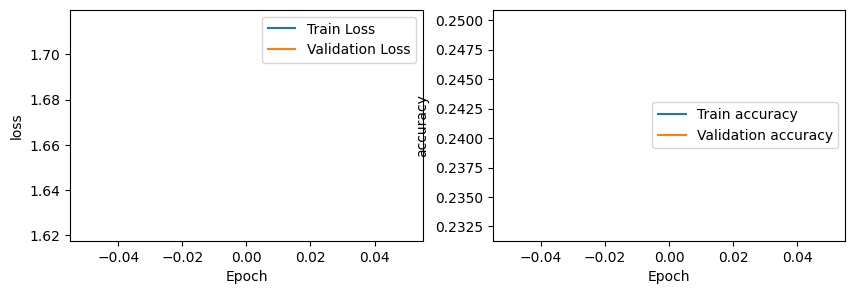

In [15]:
# Plot the training summary
print(stop_early.best)
plot_history(history)

##Pretrained Model evaluation

We define a function to compute class-wise accuracies given a model and the testing data.

In [16]:
def compute_class_accuracies(X_data, y_data, model):
  # The predicted probabilities for each class
  y_pred_probs = model.predict(X_data)

  # The corresponding predicted labels
  y_pred_labels = np.argmax(y_pred_probs, axis=1)

  # The corresponding true labels
  y_true_labels = np.argmax(y_data, axis=1)

  # Compute confusion matrix
  cm = confusion_matrix(y_true_labels, y_pred_labels)

  # Compute accuracies and weights for each class
  class_accuracies = []
  for class_label in range(len(cm)):
      class_accuracy = cm[class_label, class_label] / np.sum(cm[class_label, :])
      class_accuracies.append(class_accuracy)

  # Print the classification report
  print(classification_report(y_true_labels, y_pred_labels))

  return class_accuracies


Here we compute the class accuracies and F1.

In [17]:

# Compute class-wise accuracies of the best_model
class_accuracies = compute_class_accuracies(X_test, y_test, dnn_model)

# Print class labels along with their accuracies
for class_label, accuracy in enumerate(class_accuracies):
    print(f"Class {class_label}: Accuracy {accuracy:.2f}")


5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        32
           1       0.00      0.00      0.00        34
           2       0.17      0.92      0.28        25
           3       0.43      0.18      0.25        17
           4       0.00      0.00      0.00        37

    accuracy                           0.18       145
   macro avg       0.12      0.22      0.11       145
weighted avg       0.08      0.18      0.08       145

Class 0: Accuracy 0.00
Class 1: Accuracy 0.00
Class 2: Accuracy 0.92
Class 3: Accuracy 0.18
Class 4: Accuracy 0.00


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [18]:
best_score = dnn_model.evaluate(X_test, y_test, verbose=0)

# Evaluate and print results
best_score = dnn_model.evaluate(X_test, y_test, verbose=0)
print("Test loss:", best_score[0])
print("Test accuracy:", best_score[1])
#print("Test accuracy improvement:", 100*(best_score[1]-base_score[1])/base_score[1], "%")

Test loss: 1.6852209568023682
Test accuracy: 0.17931035161018372


##Put together all the evaluations

In [ ]:
table = PrettyTable()

table.field_names = ["Model", "Accuracy"]
# Add data to the table
table.add_row(["Base model", 0.85])
table.add_row(["Pretrained ", best_score[1]])

# Print the table
print(table)

+-------------+---------------------+
|    Model    |       Accuracy      |
+-------------+---------------------+
|  Base model |         0.85        |
| Pretrained  | 0.24137930572032928 |
+-------------+---------------------+


##Find the worst classifications for the Pretrained model

In [40]:
def find_top_N_misclassified(model,X_test,N):
  # Make predictions on the test data
  predictions = model.predict(X_test)

  # Find the misclassification confidence for each prediction
  misclassification_confidence = np.max(predictions, axis=1)

  y_true_labels = np.argmax(y_test, axis=1)

  # Calculate the difference between the predicted labels and the true labels
  difference = misclassification_confidence - y_true_labels

  # Find the indices of the top 7 most misclassified images
  top_misclassified_indices = np.argsort(np.abs(difference))[-N:]

  # Plot the top 7 most misclassified images
  plt.figure(figsize=(10, 10))
  for i, index in enumerate(top_misclassified_indices):
      plt.subplot(3, 3, i + 1)
      plt.imshow(X_test[index])
      plt.title(f"True: {y_true_labels[index]}, Predicted: {np.argmax(predictions[index])}\nMisclassification Confidence: {misclassification_confidence[index]}")
      plt.axis('off')

  plt.tight_layout()
  plt.show()

  # Store the seven most misclassified images
  misclassified_images = []

  # Iterate over the top misclassified indices and store the corresponding images
  for index in top_misclassified_indices:
      misclassified_images.append(X_test[index])
  return misclassified_images

#Transformation test

5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Shape of X_augmented: (145, 224, 224, 3)
Shape of y_augmented: (145, 5)
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


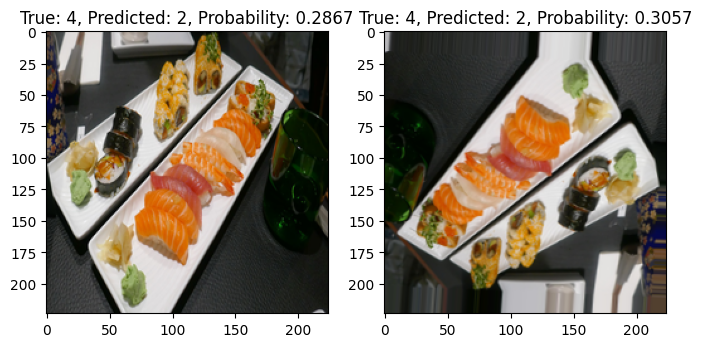

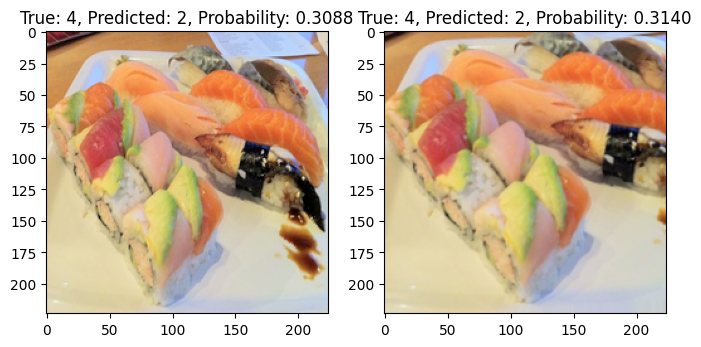

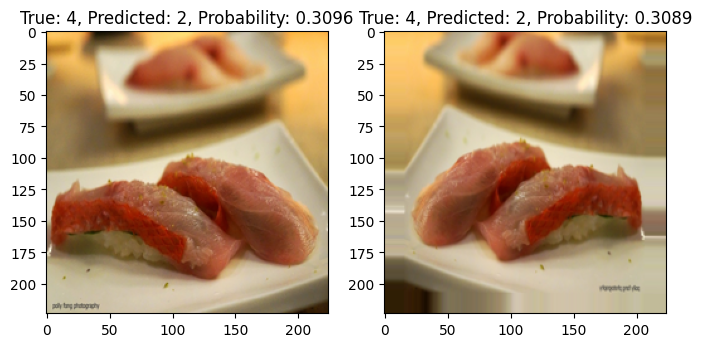

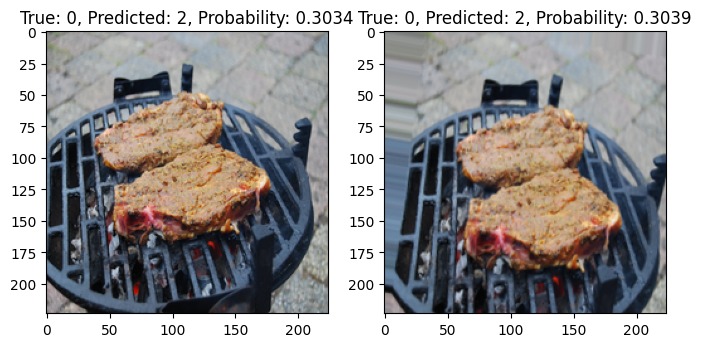

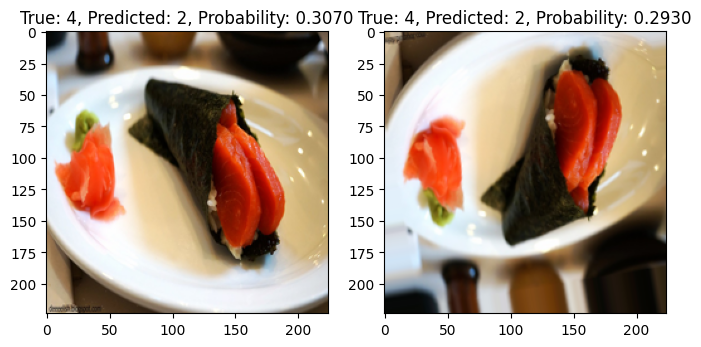

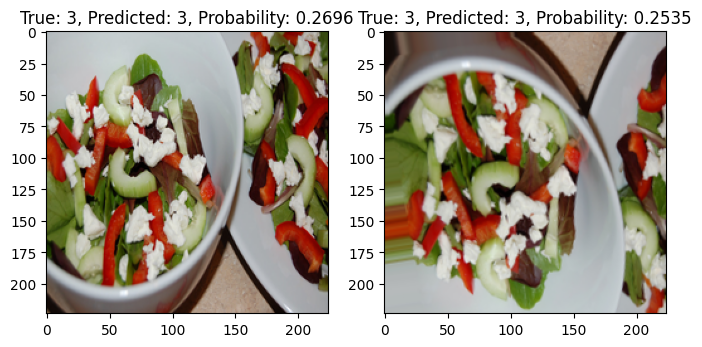

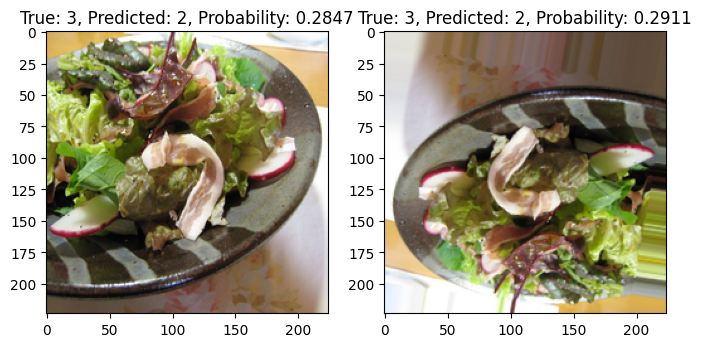

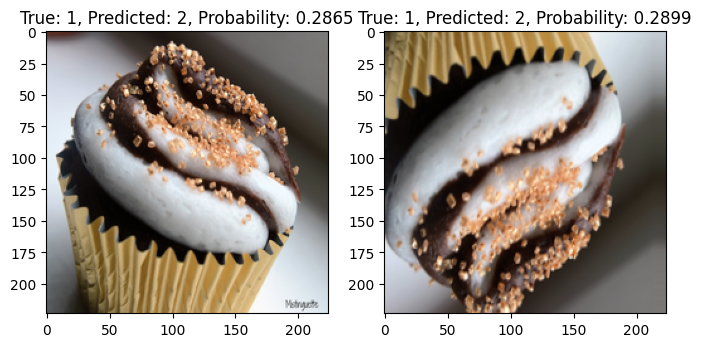

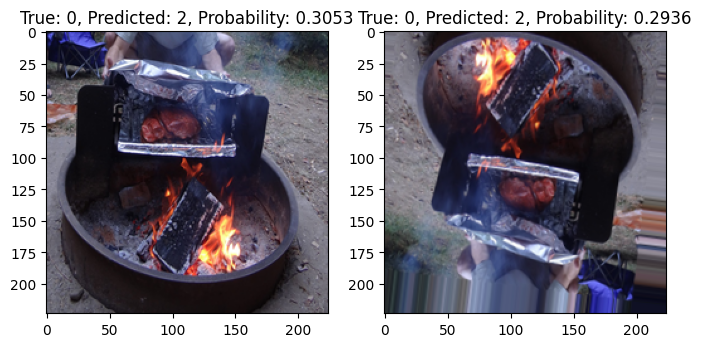

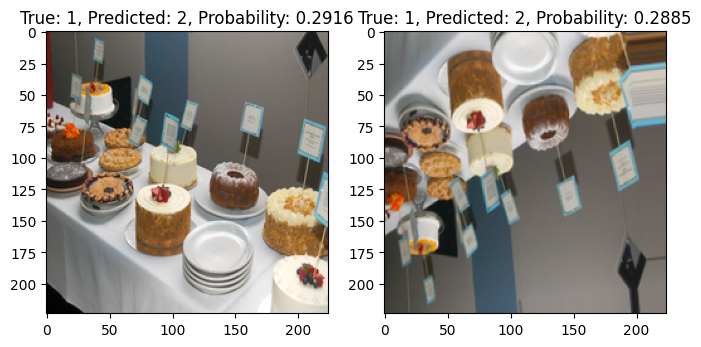

In [20]:
# Create the same ImageDataGenerator for augmentation as in the definition of our model
datagen = ImageDataGenerator(
  rotation_range=10,
  width_shift_range=0.1,
  height_shift_range=0.1,
  shear_range=0.2,
  zoom_range=0.2,
  horizontal_flip=True,
  vertical_flip = True,
  fill_mode='nearest',
  validation_split=0.2
)

# Lists to store augmented data
X_augmented = []
y_augmented = []

# The predicted probabilities for each class
y_pred_probs = dnn_model.predict(X_test)
# The corresponding predicted labels
y_pred_labels = np.argmax(y_pred_probs, axis=1)

# Iterate through all training examples
for i in range(len(X_test)):
    # Reshape the image to (1, height, width, channels) for flow method
    img = X_test[i].reshape((1,) + X_test[i].shape)

    # Generate augmented images and store in X_augmented and y_augmented
    for batch, labels_batch in datagen.flow(img, y_test[i].reshape(1, -1), batch_size=1):
        X_augmented.append(batch[0].reshape(X_test[i].shape))
        y_augmented.append(labels_batch[0])
        break  # Exit the loop after one augmented image

# Convert lists to NumPy arrays
X_augmented = np.array(X_augmented)
y_augmented = np.array(y_augmented)

# Check the shape of augmented data
print("Shape of X_augmented:", X_augmented.shape)
print("Shape of y_augmented:", y_augmented.shape)

# The predicted probabilities for each class
y_pred_probs_aug = dnn_model.predict(X_augmented)
# The corresponding predicted labels
y_pred_labels_aug = np.argmax(y_pred_probs_aug, axis=1)

# Display the first 10 examples
for i in range(10):
    plt.figure(figsize=(8, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(X_test[i].reshape(X_test[i].shape), cmap="gray")
    plt.title(f'True: {np.argmax(y_test[i])}, Predicted: {y_pred_labels[i]}, Probability: {y_pred_probs[i, y_pred_labels[i]]:.4f}')

    plt.subplot(1, 2, 2)
    plt.imshow(X_augmented[i].reshape(X_augmented[i].shape), cmap="gray")
    plt.title(f'True: {np.argmax(y_augmented[i])}, Predicted: {y_pred_labels_aug[i]}, Probability: {y_pred_probs_aug[i, y_pred_labels_aug[i]]:.4f}')

    plt.show()


In [38]:

validation_accuracies = []
#load baseline model with data augmentation
base_model=keras.models.load_model('/content/DL_Ass2/models/' + "baseline_model" + '.keras')
_, acc = base_model.evaluate(X_val, y_val)
validation_accuracies.append(acc)
#load Pretrained model with data augmentation
dnn_model = keras.models.load_model('/content/DL_Ass2/models/' + "EfficientNetB0_tuned" + '.keras')
_, acc = dnn_model.evaluate(X_val, y_val)
validation_accuracies.append(acc)
#load Pretrained model without data augmentation
#noaug_model = keras.models.load_model('/content/DL_Ass2/models/' + "EfficientNetB0_tuned_noAug" + '.keras')
#_, acc = noaug_model.evaluate(X_val, y_val)
#validation_accuracies.append(acc)

9/9 ━━━━━━━━━━━━━━━━━━━━ 63s 1s/step - accuracy: 0.2036 - loss: 5.8098


/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:396: UserWarning: Skipping variable loading for optimizer 'adam', because it has 456 variables whereas the saved optimizer has 34 variables. 
  trackable.load_own_variables(weights_store.get(inner_path))


9/9 ━━━━━━━━━━━━━━━━━━━━ 20s 783ms/step - accuracy: 0.2322 - loss: 1.7281



##In this sections we are going to implement methods for


## Layer activations

In [21]:
from keras import Model, ops
#from dl_utils import clone_and_set_weights, get_model_weights, load_or_build, KerasOptimizer
from skimage.segmentation import mark_boundaries
from keras.layers import Input
from sklearn.preprocessing import minmax_scale
from keras.models import Sequential
from keras.utils import to_categorical
from lime import lime_image
from tensorflow.keras.layers import Conv2DTranspose
from dl_utils import load_or_build
from tf_keras_vis.saliency import Saliency
from tf_keras_vis.utils import normalize
from tf_keras_vis.utils.scores import CategoricalScore
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Conv2DTranspose, UpSampling2D


In [22]:
#define the function to get the access to the layers input
def get_layer_output(model, layer_name):
    return Model(model.inputs,
                 model.get_layer(layer_name).output)

In [23]:
#param model, trained model
#param test_instance , test set
def layer_activation(model,test_instance,layer_name="conv1_conv"):
  num_filters = dnn_model.get_layer(layer_name).output.shape[-1]
  get_activations = get_layer_output(model, layer_name)
  activations = get_activations(np.expand_dims(test_instance, axis=0))[0]
  rows_cols = int(np.ceil(np.sqrt(num_filters)))
  fig, ax = plt.subplots(rows_cols, rows_cols, figsize=(2 * rows_cols, 2 * rows_cols))
  fig.suptitle(layer_name)
  for filter_idx in range(num_filters):
      ax[filter_idx // rows_cols][filter_idx % rows_cols].imshow(activations[:, :, filter_idx])
  fig.tight_layout(rect=[0, 0.03, 1, 0.95])
  plt.show()

## Maximally activating images

In [24]:
def get_excitement(images, model, layer_name, filter_idx, batch_size=128):
    excitements = np.array([])
    get_activations = get_layer_output(model, layer_name)
    for i in range(0, len(images), batch_size):
        activations = get_activations(images[i : i + batch_size])[:, :, :, filter_idx]
        excitements = np.hstack([excitements, np.mean(np.abs(activations), axis=(1, 2))])
    return excitements

In [25]:
def get_top_exciting_instances(images, model,
                               layer_name, filter_idx, top=4):
    excitements = get_excitement(images, model,
                                 layer_name, filter_idx)
    excitements_idx = np.argsort(excitements)[-top:][::-1]
    return excitements_idx, excitements[excitements_idx]

In [26]:
def show_exciting_images(images, model, layer_name, filter_idx, top=4):
    excitements_idx, excitements = get_top_exciting_instances(images, model, layer_name, filter_idx, top)
    rows_cols = int(np.ceil(np.sqrt(top)))
    fig, ax = plt.subplots(rows_cols, rows_cols, figsize=(2 * rows_cols, 2 * rows_cols))
    for i, excitement_idx in enumerate(excitements_idx):
        ax[i // rows_cols][i % rows_cols].imshow(images[excitement_idx])
    fig.tight_layout()
    plt.show()

## Deconvolving an activation

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step


IndexError: index 2 is out of bounds for axis 0 with size 2

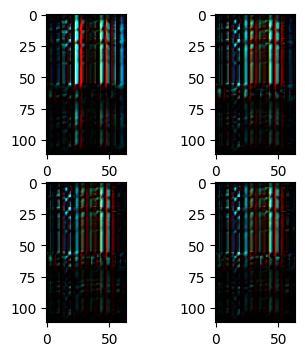

In [27]:
def make_deconvolving_model(model, layer_name, filter_idx):
    conv_layers = [layer.name for layer in model.layers if layer.name.startswith("conv") and layer.name.endswith("conv")]
    layer_idx = conv_layers.index(layer_name)
    dec_model = Sequential()
    dec_model.add(Input(model.get_layer(conv_layers[0]).output.shape[1:3] + (1,)))
    for idx in range(layer_idx, 0, -1):
        original = model.get_layer(conv_layers[idx])
        prev = model.get_layer(conv_layers[idx - 1])
        deconv = Conv2DTranspose(
            prev.filters, kernel_size=prev.kernel_size, padding="same", activation="relu", use_bias=False
        )
        dec_model.add(deconv)
    original = model.get_layer(conv_layers[0])
    final = Conv2DTranspose(3, kernel_size=original.kernel_size, padding="same", activation="relu", use_bias=False)
    dec_model.add(final)
    for idx, lyr in enumerate(dec_model.layers):
        original = model.get_layer(conv_layers[layer_idx - idx])
        orig_weights = original.get_weights()[0]
        if idx == 0:
            orig_weights = orig_weights[..., filter_idx, None]
        lyr.set_weights([orig_weights])
    return dec_model


conv_layers = [layer.name for layer in dnn_model.layers if layer.name.startswith("conv")]
layer_name = conv_layers[1]

filter_idx = 7

num_filters = dnn_model.get_layer(layer_name).output.shape[-1]
get_activations = get_layer_output(dnn_model, layer_name)
activations = get_activations(np.expand_dims(X_test[0,:,:,:], axis=0))[0]
deconvolving_model = make_deconvolving_model(dnn_model, layer_name,filter_idx)
preds = deconvolving_model.predict(np.expand_dims(activations, axis=3))
fig, ax = plt.subplots(2, 2, figsize=(4, 4))
for act in range(len(activations)):
    ax[act // 2][act % 2].imshow(preds[act])
fig.tight_layout()

## Saliency maps

In [28]:

def generate_saliency_map(model, score, x, smooth_samples=20, smooth_noise=0.2):
    saliency = Saliency(model, clone=False)
    saliency_map = saliency(score, x, smooth_samples=smooth_samples, smooth_noise=smooth_noise)
    saliency_map = normalize(saliency_map)
    return saliency_map

#LIME

In [29]:
def lime_explain(model, image,  top_labels=5, hide_color=0, num_samples=1, num_features=5):
    # Create a Lime explainer instance for images
    explainer = lime_image.LimeImageExplainer()


    # Define a function to predict with your model
    def predict_fn(images):
        return model.predict(images)

    # Generate explanations
    explanation = explainer.explain_instance(image,
                                             predict_fn,
                                             top_labels=top_labels,
                                             hide_color=hide_color,
                                             num_samples=num_samples)

    # Visualize the explanations
    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0],
                                                positive_only=False,
                                                num_features=num_features,
                                                hide_rest=False)
    return mark_boundaries(temp / 2 + 0.5, mask)


Pretrained network Maximally activating images


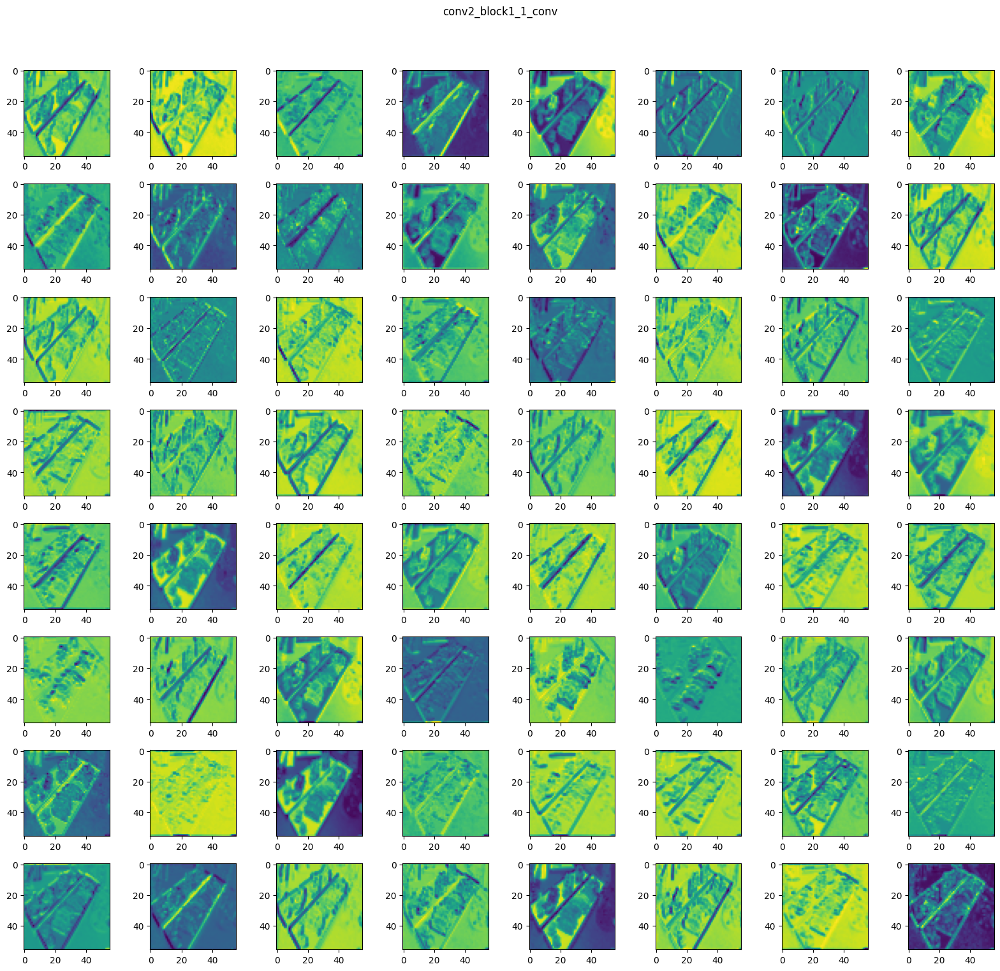

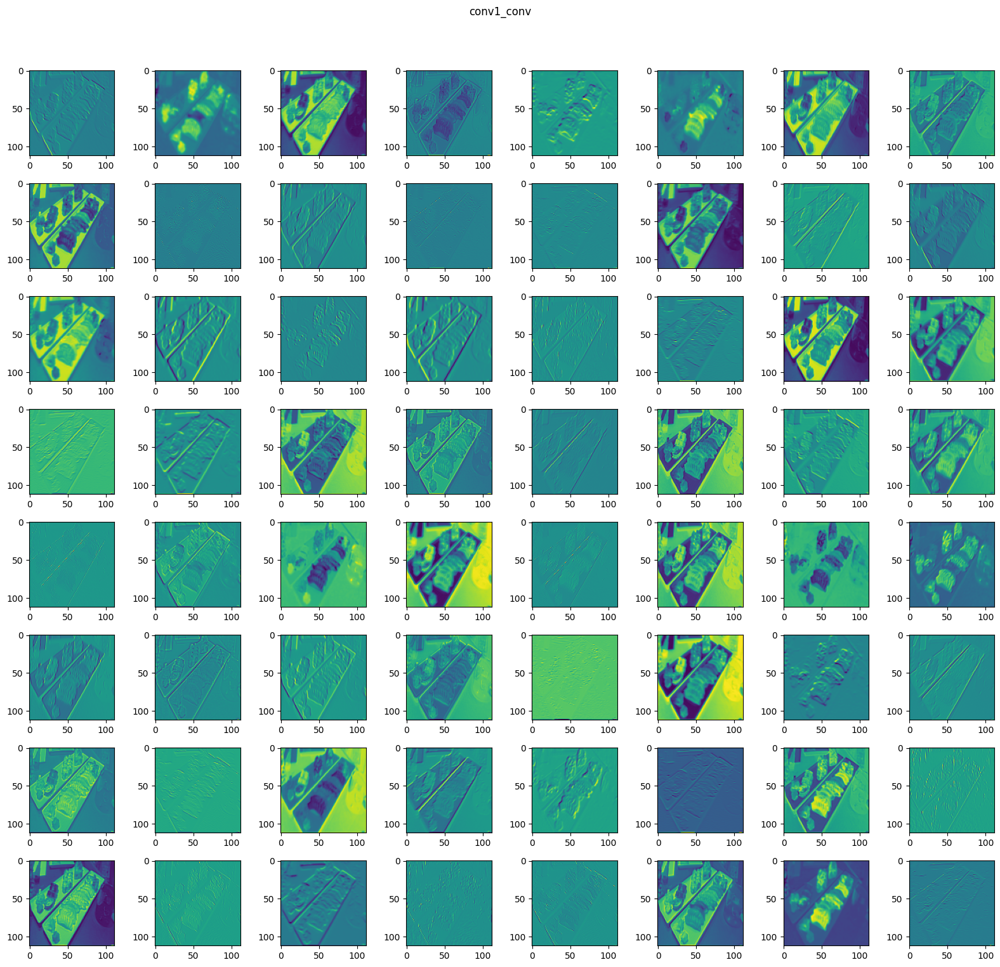

In [34]:
#Layer activation

#Visualize for pretrained model
print("Pretrained network Maximally activating images")
layer_activation(dnn_model,X_test[0,:,:,:], layer_name="conv2_block1_1_conv")
layer_activation(dnn_model,X_test[0,:,:,:])

Pretrained network Maximally activating images


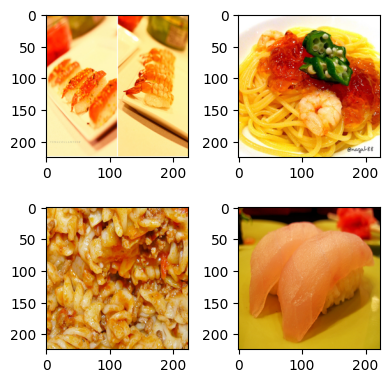

In [31]:
#Maximally activating images for each CNN model we have created

#visualize for pretrained model
conv_layers = [layer.name for layer in dnn_model.layers if layer.name.startswith("conv")]
print("Pretrained network Maximally activating images")
show_exciting_images(X_train, dnn_model, conv_layers[1], filter_idx=3)

results for Pretraned network


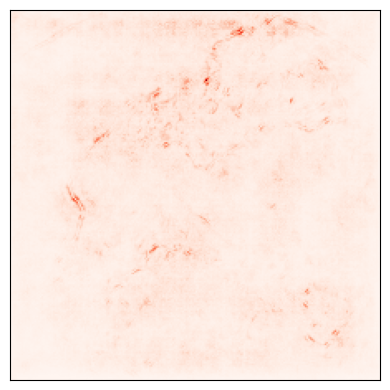

In [32]:
#saliency matrix

print("results for Pretraned network")

# Create a CategoricalScore object
score = CategoricalScore([0])

# Generate saliency map
saliency_map = generate_saliency_map(dnn_model, score, X_train[0,:,:,:])

subplot_args = {
    'nrows': 1,
    'ncols': 1,
    'figsize': (5, 4),
    'subplot_kw': {'xticks': [], 'yticks': []}
}
# Plot the saliency map
f, ax = plt.subplots(**subplot_args)
ax.imshow(saliency_map[0], cmap='Reds')
plt.tight_layout()
plt.show()

lime for Pretarined lecture 


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:918: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:918: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:918: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:918: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_regression.py:918: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, Undefined

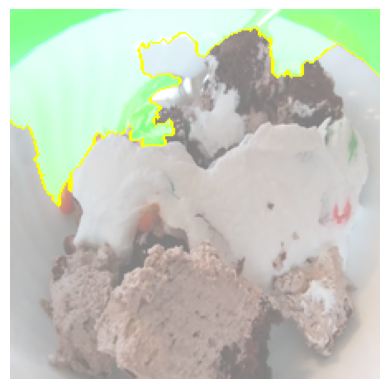

In [33]:
#lime
print("lime for Pretarined lecture ")
explanation_output=lime_explain(dnn_model,X_train[0,:,:,:])
# Display the explanation using Matplotlib
plt.imshow(explanation_output)
plt.axis('off')
plt.show()